#Download Dataset

In [ ]:
!pip install fiftyone

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 20.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.3/42.3 kB 5.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.3/139.3 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.4/53.4 kB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.8/57.8 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 11.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.9/108.9 kB 11.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.6/70.6 kB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 677.1/677.1 kB 10.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.3/70.3 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 192.5/192.5 kB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.5/88.5 kB 3.7 MB/s eta 0:00:00
  Preparing metadata (setup.py

In [ ]:
!pip install torch torchvision

In [ ]:
import fiftyone as fo
import fiftyone.zoo as foz
import matplotlib.pyplot as plt
from fiftyone import ViewField as F
import torch
import torchvision
from PIL import Image
from torchvision.transforms import functional as func
import fiftyone as fo

Migrating database to v0.23.2


INFO:fiftyone.migrations.runner:Migrating database to v0.23.2


In [ ]:
dataset = foz.load_zoo_dataset(
    "coco-2017",
    split="validation",
    dataset_name="evaluate-detections-tutorial",
)
dataset.persistent = True

INFO:fiftyone.zoo.datasets:Downloading split 'validation' to '/root/fiftyone/coco-2017/validation' if necessary


INFO:fiftyone.utils.coco:Downloading annotations to '/root/fiftyone/coco-2017/tmp-download/annotations_trainval2017.zip'


 100% |██████|    1.9Gb/1.9Gb [5.8s elapsed, 0s remaining, 346.4Mb/s]       


INFO:eta.core.utils: 100% |██████|    1.9Gb/1.9Gb [5.8s elapsed, 0s remaining, 346.4Mb/s]       


Extracting annotations to '/root/fiftyone/coco-2017/raw/instances_val2017.json'


INFO:fiftyone.utils.coco:Extracting annotations to '/root/fiftyone/coco-2017/raw/instances_val2017.json'


INFO:fiftyone.utils.coco:Downloading images to '/root/fiftyone/coco-2017/tmp-download/val2017.zip'


 100% |██████|    6.1Gb/6.1Gb [17.6s elapsed, 0s remaining, 372.8Mb/s]      


INFO:eta.core.utils: 100% |██████|    6.1Gb/6.1Gb [17.6s elapsed, 0s remaining, 372.8Mb/s]      


Extracting images to '/root/fiftyone/coco-2017/validation/data'


INFO:fiftyone.utils.coco:Extracting images to '/root/fiftyone/coco-2017/validation/data'


Writing annotations to '/root/fiftyone/coco-2017/validation/labels.json'


INFO:fiftyone.utils.coco:Writing annotations to '/root/fiftyone/coco-2017/validation/labels.json'


Dataset info written to '/root/fiftyone/coco-2017/info.json'


INFO:fiftyone.zoo.datasets:Dataset info written to '/root/fiftyone/coco-2017/info.json'


Loading 'coco-2017' split 'validation'


INFO:fiftyone.zoo.datasets:Loading 'coco-2017' split 'validation'


 100% |███████████████| 5000/5000 [30.5s elapsed, 0s remaining, 177.4 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [30.5s elapsed, 0s remaining, 177.4 samples/s]      


Dataset 'evaluate-detections-tutorial' created


INFO:fiftyone.zoo.datasets:Dataset 'evaluate-detections-tutorial' created


In [ ]:
# Print a ground truth detection
sample = dataset.first()
print(sample.ground_truth.detections[0])

<Detection: {
    'id': '658f3ceefd651d196c38d4ab',
    'attributes': {},
    'tags': [],
    'label': 'potted plant',
    'bounding_box': [
        0.37028125,
        0.3345305164319249,
        0.038593749999999996,
        0.16314553990610328,
    ],
    'mask': None,
    'confidence': None,
    'index': None,
    'supercategory': 'furniture',
    'iscrowd': 0,
}>


In [ ]:
# Print some information about the dataset
print(dataset)

Name:        evaluate-detections-tutorial
Media type:  image
Num samples: 5000
Persistent:  True
Tags:        []
Sample fields:
    id:           fiftyone.core.fields.ObjectIdField
    filepath:     fiftyone.core.fields.StringField
    tags:         fiftyone.core.fields.ListField(fiftyone.core.fields.StringField)
    metadata:     fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.metadata.ImageMetadata)
    ground_truth: fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)


In [ ]:
session = fo.launch_app(dataset)


Welcome to

███████╗██╗███████╗████████╗██╗   ██╗ ██████╗ ███╗   ██╗███████╗
██╔════╝██║██╔════╝╚══██╔══╝╚██╗ ██╔╝██╔═══██╗████╗  ██║██╔════╝
█████╗  ██║█████╗     ██║    ╚████╔╝ ██║   ██║██╔██╗ ██║█████╗
██╔══╝  ██║██╔══╝     ██║     ╚██╔╝  ██║   ██║██║╚██╗██║██╔══╝
██║     ██║██║        ██║      ██║   ╚██████╔╝██║ ╚████║███████╗
╚═╝     ╚═╝╚═╝        ╚═╝      ╚═╝    ╚═════╝ ╚═╝  ╚═══╝╚══════╝ v0.23.2

If you're finding FiftyOne helpful, here's how you can get involved:

|
|  ⭐⭐⭐ Give the project a star on GitHub ⭐⭐⭐
|  https://github.com/voxel51/fiftyone
|
|  🚀🚀🚀 Join the FiftyOne Slack community 🚀🚀🚀
|  https://slack.voxel51.com
|



INFO:fiftyone.core.session.session:
Welcome to

███████╗██╗███████╗████████╗██╗   ██╗ ██████╗ ███╗   ██╗███████╗
██╔════╝██║██╔════╝╚══██╔══╝╚██╗ ██╔╝██╔═══██╗████╗  ██║██╔════╝
█████╗  ██║█████╗     ██║    ╚████╔╝ ██║   ██║██╔██╗ ██║█████╗
██╔══╝  ██║██╔══╝     ██║     ╚██╔╝  ██║   ██║██║╚██╗██║██╔══╝
██║     ██║██║        ██║      ██║   ╚██████╔╝██║ ╚████║███████╗
╚═╝     ╚═╝╚═╝        ╚═╝      ╚═╝    ╚═════╝ ╚═╝  ╚═══╝╚══════╝ v0.23.2

If you're finding FiftyOne helpful, here's how you can get involved:

|
|  ⭐⭐⭐ Give the project a star on GitHub ⭐⭐⭐
|  https://github.com/voxel51/fiftyone
|
|  🚀🚀🚀 Join the FiftyOne Slack community 🚀🚀🚀
|  https://slack.voxel51.com
|



In [ ]:
predictions_view = dataset.take(5000, seed=51)



## Object Detection Models


In [ ]:
# Run the model on GPU if it is available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")


In [ ]:
# Load a pre-trained models
model_fasterrcnn_resnet50 = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True);
model_fasterrcnn_resnet50.to(device)
model_fasterrcnn_resnet50.eval()


model_retinanet_resnet50_fpn = torchvision.models.detection.retinanet_resnet50_fpn(pretrained=True);
model_retinanet_resnet50_fpn.to(device)
model_retinanet_resnet50_fpn.eval()


model_ssd = torchvision.models.detection.ssd300_vgg16(pretrained=True);
model_ssd.to(device)
model_ssd.eval()

print("Models are ready")

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:01<00:00, 87.1MB/s]
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `Non

Models are ready


In [ ]:
classes = dataset.default_classes

In [ ]:

def eval(model, predictions_view, save_model_name):

  # Add predictions to samples
  with fo.ProgressBar() as pb:
      for sample in pb(predictions_view):
          # Load image
          image = Image.open(sample.filepath)
          image = func.to_tensor(image).to(device)
          c, h, w = image.shape

          # Perform inference
          preds = model([image])[0]
          labels = preds["labels"].cpu().detach().numpy()
          scores = preds["scores"].cpu().detach().numpy()
          boxes = preds["boxes"].cpu().detach().numpy()

          # Convert detections to FiftyOne format
          detections = []
          for label, score, box in zip(labels, scores, boxes):
              # Convert to [top-left-x, top-left-y, width, height]
              # in relative coordinates in [0, 1] x [0, 1]
              x1, y1, x2, y2 = box
              rel_box = [x1 / w, y1 / h, (x2 - x1) / w, (y2 - y1) / h]

              detections.append(
                  fo.Detection(
                      label=classes[label],
                      bounding_box=rel_box,
                      confidence=score
                  )
              )

          # Save predictions to dataset
          sample[save_model_name] = fo.Detections(detections=detections)
          sample.save()

  print("Finished adding predictions")

In [ ]:
eval(model=model_fasterrcnn_resnet50, predictions_view=predictions_view, save_model_name='faster_rcnn')

 100% |███████████████| 5000/5000 [12.3m elapsed, 0s remaining, 6.3 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [12.3m elapsed, 0s remaining, 6.3 samples/s]      


Finished adding predictions


In [ ]:
eval(model=model_retinanet_resnet50_fpn, predictions_view=predictions_view, save_model_name='ratina_net')

 100% |███████████████| 5000/5000 [17.5m elapsed, 0s remaining, 5.1 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [17.5m elapsed, 0s remaining, 5.1 samples/s]      


Finished adding predictions


In [ ]:
eval(model=model_ssd, predictions_view=predictions_view, save_model_name='ssd_model')

 100% |███████████████| 5000/5000 [19.9m elapsed, 0s remaining, 5.2 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [19.9m elapsed, 0s remaining, 5.2 samples/s]      


Finished adding predictions


In [ ]:
session.view = predictions_view

In [ ]:
session.freeze()  # screenshot the active App for sharing

In [ ]:
def calc_map(result):
  print('mAP : ', result.mAP())
  result.print_report(classes=classes_sort)
  plot = result.plot_pr_curves(classes=classes_sort)
  plot.show()

# **1 - FasterRCNN Resnet50 Model**

Evaluating detections...


INFO:fiftyone.utils.eval.detection:Evaluating detections...


 100% |███████████████| 5000/5000 [14.2m elapsed, 0s remaining, 6.9 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [14.2m elapsed, 0s remaining, 6.9 samples/s]      


Performing IoU sweep...


INFO:fiftyone.utils.eval.coco:Performing IoU sweep...


 100% |███████████████| 5000/5000 [4.3m elapsed, 0s remaining, 19.7 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [4.3m elapsed, 0s remaining, 19.7 samples/s]      


mAP :  0.36965055705350636
                precision    recall  f1-score   support

        person       0.44      0.94      0.60     18199
           car       0.25      0.88      0.39      2416
         chair       0.15      0.73      0.26      2074
          book       0.31      0.88      0.46      2943
        bottle       0.24      0.82      0.38      1357
           cup       0.21      0.80      0.33       957
  dining table       0.09      0.76      0.16       703
 traffic light       0.19      0.73      0.30       654
          bowl       0.16      0.84      0.27       652
       handbag       0.09      0.61      0.15       540
          bird       0.39      0.83      0.53       836
          boat       0.20      0.82      0.32       632
         truck       0.14      0.84      0.25       419
         bench       0.08      0.64      0.15       473
      umbrella       0.22      0.83      0.35       511
           cow       0.39      0.93      0.55       581
        banana      

For confidence threshold None:
accuracy :  0.23970182862911052
precision :  0.24944878617521096
recall :  0.859837256033265
fscore :  0.3867088409382731


/usr/local/lib/python3.10/dist-packages/fiftyone/core/plots/plotly.py:1575: UserWarning:

Interactive plots are currently only supported in Jupyter notebooks. Support outside of notebooks and in Google Colab and Databricks will be included in an upcoming release. In the meantime, you can still use this plot, but note that (i) selecting data will not trigger callbacks, and (ii) you must manually call `plot.show()` to launch a new plot that reflects the current state of an attached session.

See https://docs.voxel51.com/user_guide/plots.html#working-in-notebooks for more information.



{'tp': 29736, 'fn': 7045, 'fp': 130036}
IOU Score 0.14208136690863368
Evaluating detections...


INFO:fiftyone.utils.eval.detection:Evaluating detections...


 100% |███████████████| 5000/5000 [4.8m elapsed, 0s remaining, 14.0 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [4.8m elapsed, 0s remaining, 14.0 samples/s]      


Performing IoU sweep...


INFO:fiftyone.utils.eval.coco:Performing IoU sweep...


 100% |███████████████| 5000/5000 [1.9m elapsed, 0s remaining, 32.2 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [1.9m elapsed, 0s remaining, 32.2 samples/s]      


mAP :  0.34474258303522526
                precision    recall  f1-score   support

        person       0.76      0.84      0.80     12871
           car       0.62      0.73      0.67      2084
         chair       0.49      0.49      0.49      1862
          book       0.59      0.63      0.61      1829
        bottle       0.58      0.65      0.61      1112
           cup       0.54      0.61      0.58       912
  dining table       0.38      0.54      0.44       697
 traffic light       0.53      0.59      0.56       644
          bowl       0.49      0.63      0.55       636
       handbag       0.35      0.30      0.33       540
          bird       0.74      0.68      0.71       629
          boat       0.51      0.62      0.56       465
         truck       0.51      0.59      0.55       415
         bench       0.39      0.37      0.38       414
      umbrella       0.56      0.63      0.59       432
           cow       0.69      0.76      0.73       414
        banana      

For confidence threshold 0.5:
accuracy :  0.48581652682960724
precision :  0.6209231588996692
recall :  0.6906625836564344
fscore :  0.6539387845768934


/usr/local/lib/python3.10/dist-packages/fiftyone/core/plots/plotly.py:1575: UserWarning:

Interactive plots are currently only supported in Jupyter notebooks. Support outside of notebooks and in Google Colab and Databricks will be included in an upcoming release. In the meantime, you can still use this plot, but note that (i) selecting data will not trigger callbacks, and (ii) you must manually call `plot.show()` to launch a new plot that reflects the current state of an attached session.

See https://docs.voxel51.com/user_guide/plots.html#working-in-notebooks for more information.



{'tp': 24255, 'fn': 12526, 'fp': 17074}
IOU Score 0.36696651106773465
Number of predictions with confidence >= 0.5: 53855
Evaluating detections...


INFO:fiftyone.utils.eval.detection:Evaluating detections...


 100% |███████████████| 5000/5000 [3.8m elapsed, 0s remaining, 24.0 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [3.8m elapsed, 0s remaining, 24.0 samples/s]      


Performing IoU sweep...


INFO:fiftyone.utils.eval.coco:Performing IoU sweep...


 100% |███████████████| 5000/5000 [1.7m elapsed, 0s remaining, 57.1 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [1.7m elapsed, 0s remaining, 57.1 samples/s]      


mAP :  0.31863213953232294
                precision    recall  f1-score   support

        person       0.87      0.76      0.81     11820
           car       0.76      0.61      0.67      1984
         chair       0.66      0.35      0.46      1814
          book       0.65      0.30      0.41      1282
        bottle       0.72      0.55      0.62      1072
           cup       0.69      0.48      0.57       904
  dining table       0.54      0.41      0.46       697
 traffic light       0.67      0.50      0.57       641
          bowl       0.65      0.52      0.58       630
       handbag       0.51      0.20      0.28       540
          bird       0.83      0.56      0.67       524
          boat       0.63      0.49      0.55       439
         truck       0.70      0.42      0.53       415
         bench       0.59      0.28      0.38       413
      umbrella       0.70      0.54      0.61       421
           cow       0.84      0.67      0.75       391
        banana      

For confidence threshold 0.75:
accuracy :  0.4952804986642921
precision :  0.7665644488853668
recall :  0.5832481321274086
fscore :  0.6624583134826109


/usr/local/lib/python3.10/dist-packages/fiftyone/core/plots/plotly.py:1575: UserWarning:

Interactive plots are currently only supported in Jupyter notebooks. Support outside of notebooks and in Google Colab and Databricks will be included in an upcoming release. In the meantime, you can still use this plot, but note that (i) selecting data will not trigger callbacks, and (ii) you must manually call `plot.show()` to launch a new plot that reflects the current state of an attached session.

See https://docs.voxel51.com/user_guide/plots.html#working-in-notebooks for more information.



{'tp': 20884, 'fn': 15897, 'fp': 6775}
IOU Score 0.39614310437577016
Number of predictions with confidence >= 0.75: 43556
Evaluating detections...


INFO:fiftyone.utils.eval.detection:Evaluating detections...


 100% |███████████████| 5000/5000 [2.9m elapsed, 0s remaining, 34.3 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [2.9m elapsed, 0s remaining, 34.3 samples/s]      


Performing IoU sweep...


INFO:fiftyone.utils.eval.coco:Performing IoU sweep...


 100% |███████████████| 5000/5000 [1.5m elapsed, 0s remaining, 67.4 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [1.5m elapsed, 0s remaining, 67.4 samples/s]      


mAP :  0.2781146341922165
                precision    recall  f1-score   support

        person       0.93      0.64      0.76     11284
           car       0.87      0.47      0.61      1942
         chair       0.79      0.23      0.35      1796
          book       0.72      0.08      0.14      1172
        bottle       0.83      0.42      0.56      1053
           cup       0.82      0.37      0.51       902
  dining table       0.68      0.26      0.38       697
 traffic light       0.79      0.39      0.52       638
          bowl       0.85      0.35      0.49       628
       handbag       0.74      0.10      0.17       540
          bird       0.87      0.41      0.55       453
          boat       0.80      0.36      0.50       430
         truck       0.81      0.28      0.42       415
         bench       0.74      0.21      0.33       413
      umbrella       0.83      0.40      0.54       419
           cow       0.92      0.55      0.69       383
        banana       

For confidence threshold 0.9:
accuracy :  0.4310123232781432
precision :  0.8729137957433777
recall :  0.4598693232233605
fscore :  0.6023879966187657


/usr/local/lib/python3.10/dist-packages/fiftyone/core/plots/plotly.py:1575: UserWarning:

Interactive plots are currently only supported in Jupyter notebooks. Support outside of notebooks and in Google Colab and Databricks will be included in an upcoming release. In the meantime, you can still use this plot, but note that (i) selecting data will not trigger callbacks, and (ii) you must manually call `plot.show()` to launch a new plot that reflects the current state of an attached session.

See https://docs.voxel51.com/user_guide/plots.html#working-in-notebooks for more information.



{'tp': 16693, 'fn': 20088, 'fp': 2490}
IOU Score 0.3571867482409426
Number of predictions with confidence >= 0.9: 39271


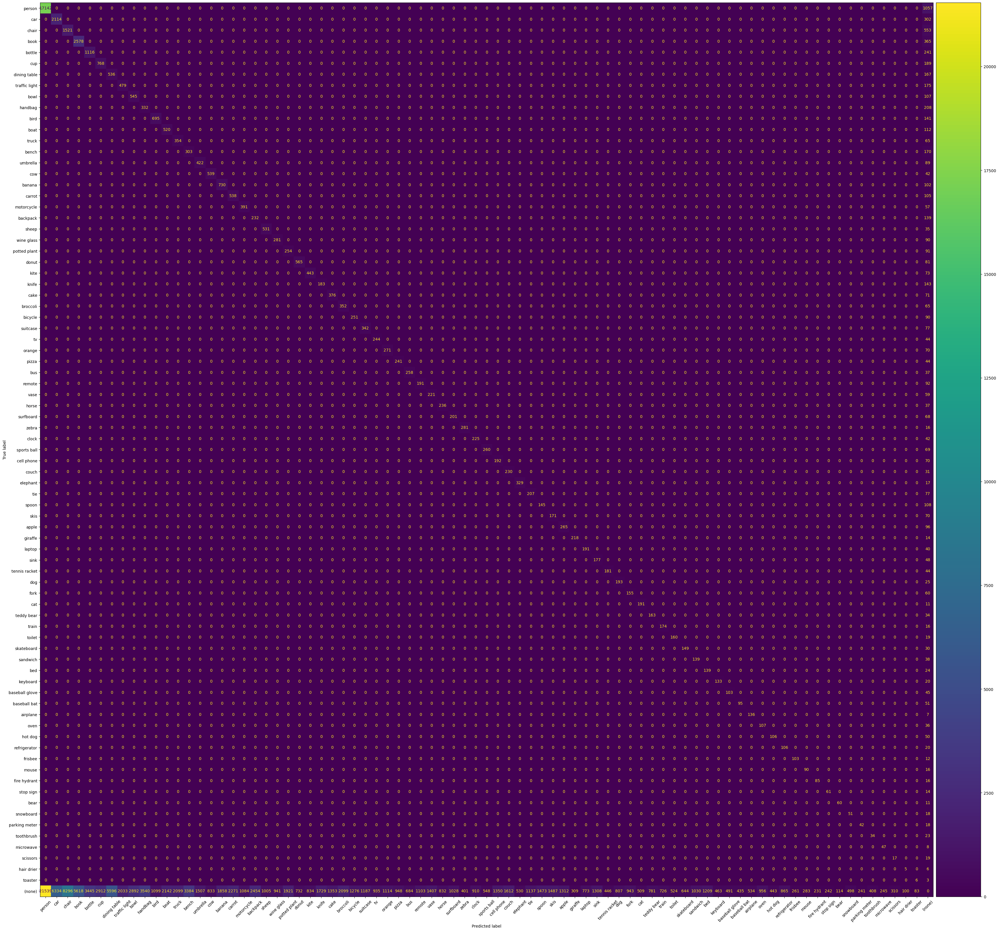

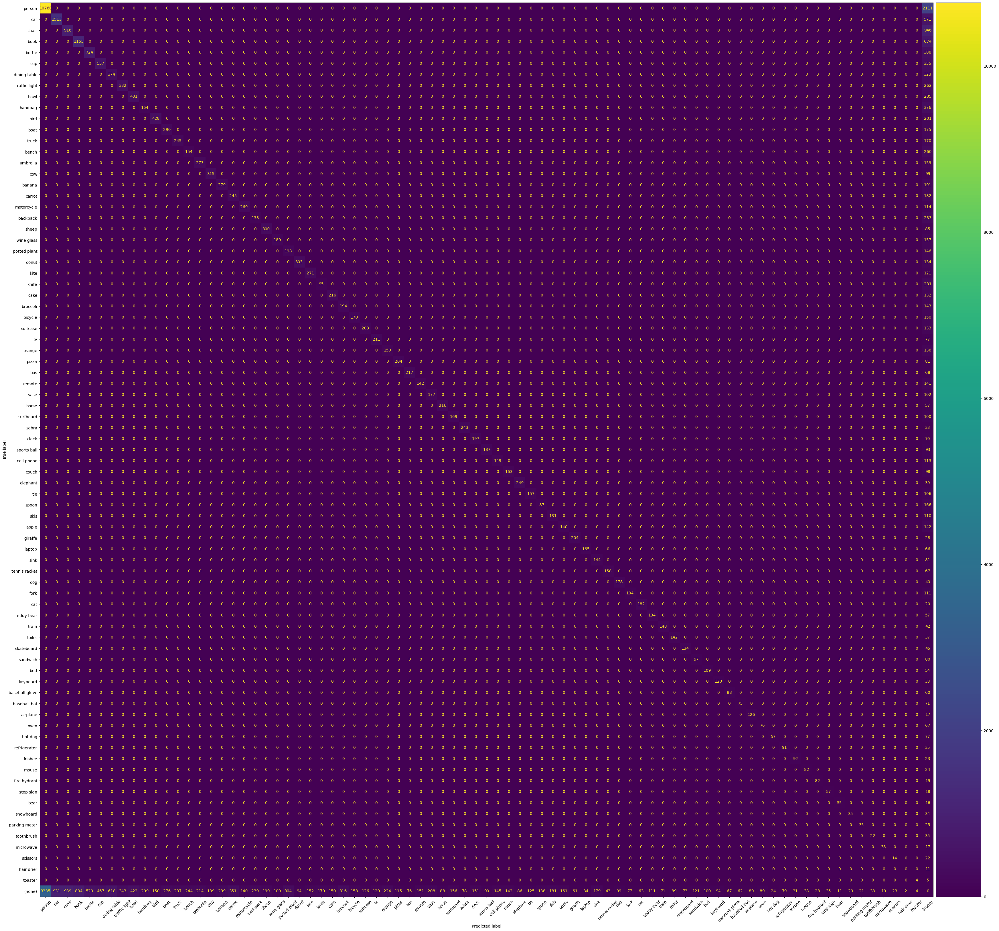

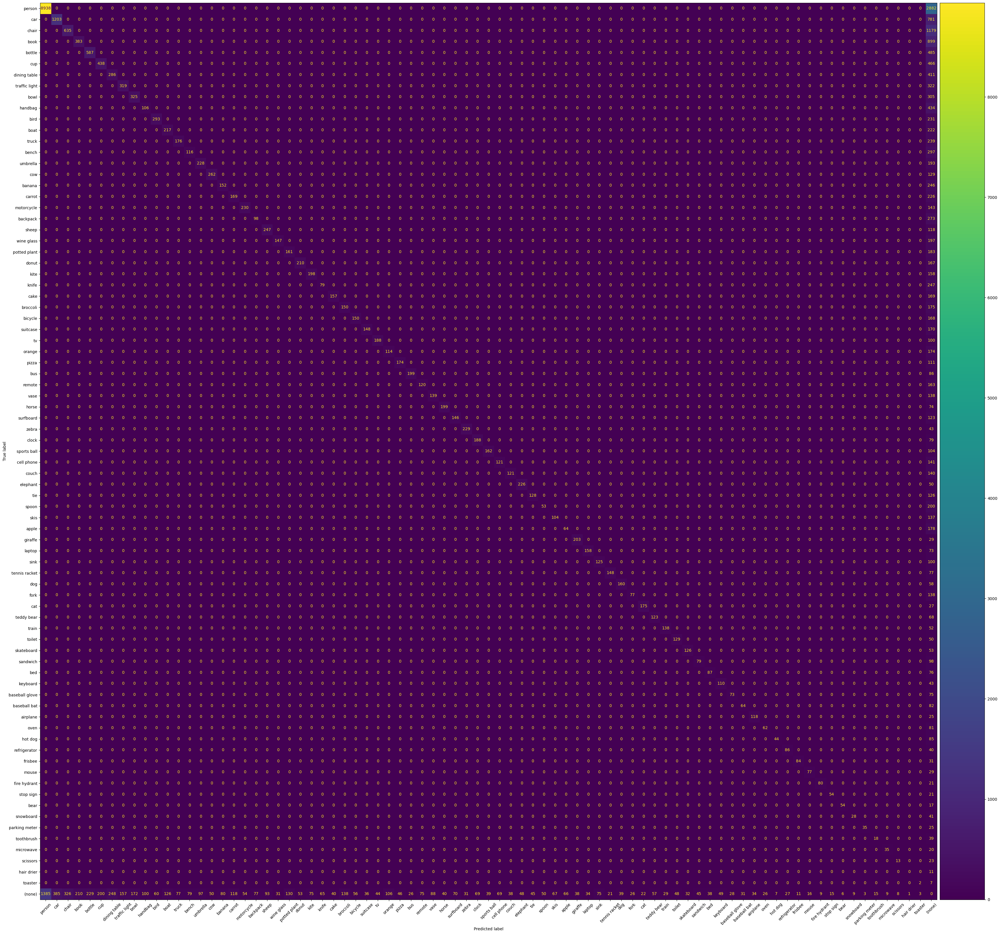

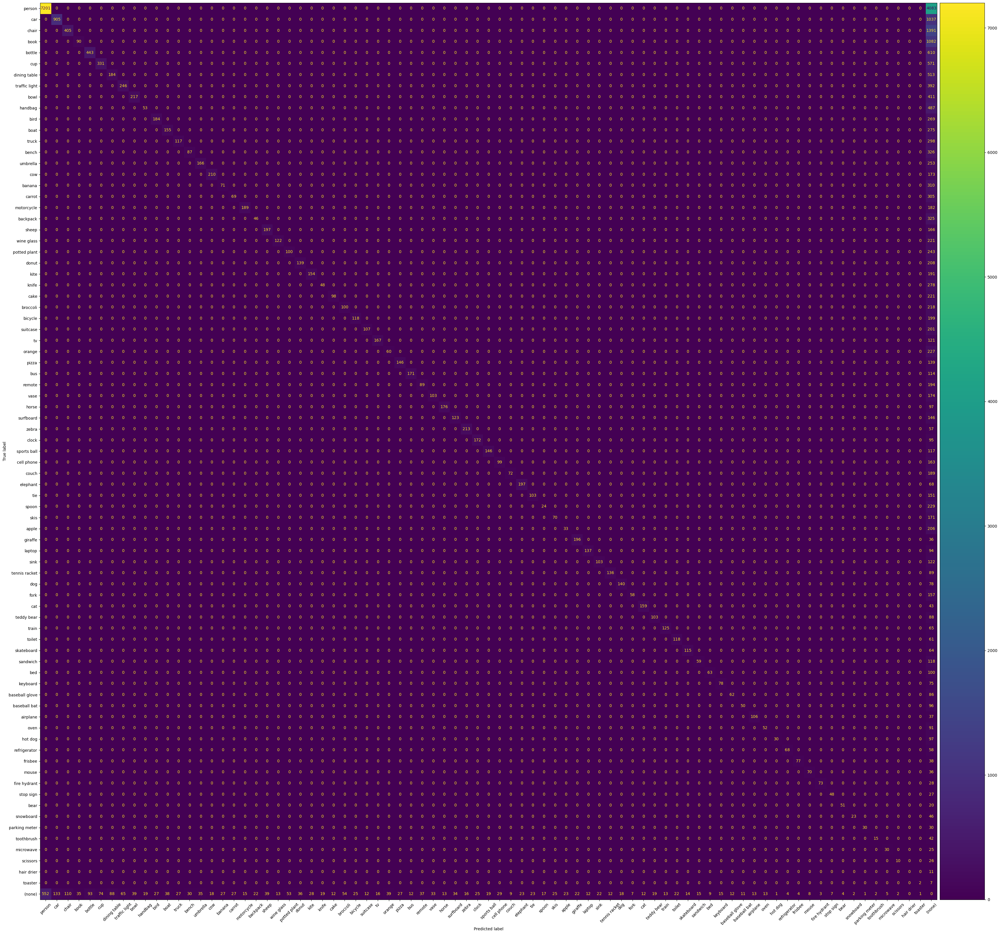

In [ ]:
from copy import deepcopy
counts = dataset.count_values("ground_truth.detections.label")
classes_sort = sorted(counts, key=counts.get, reverse=True)[:]
confidence_thresholds = [None, 0.5, 0.75,0.9]  # Include None for the initial evaluation without confidence filtering

for threshold in confidence_thresholds:
    if threshold is None:
        predictions_filtered = predictions_view
    else:
        predictions_filtered = predictions_view.filter_labels("faster_rcnn", F("confidence") >= threshold, only_matches=False)

    eval_result = predictions_filtered.evaluate_detections(
        "faster_rcnn",
        gt_field="ground_truth",
        eval_key="eval",
        compute_mAP=True,
    )

    calc_map(eval_result)

    d = eval_result.metrics(classes_sort)
    acc = d['accuracy']
    pre = d['precision']
    rec = d['recall']
    fsc = d['fscore']

    print(f'For confidence threshold {threshold}:')
    print('accuracy : ', acc)
    print('precision : ', pre)
    print('recall : ', rec)
    print('fscore : ', fsc)

    plot = eval_result.plot_confusion_matrix(classes=classes_sort[:], backend="matplotlib", figsize=(35, 35))
    plot.show()

    plot = eval_result.plot_confusion_matrix(classes=classes_sort[:10])
    plot.show()

    eval_patches = predictions_filtered.to_evaluation_patches("eval")
    print(eval_patches.count_values("type"))

    iou = eval_patches.count_values('iou')
    x = list(iou.items())
    sum_iou = 0.0
    for i, v in x:
        if not i:
            continue
        sum_iou += (i * v)

    print('IOU Score', sum_iou / sum(iou.values()))

    if threshold is not None:
        print(f"Number of predictions with confidence >= {threshold}: {sum(iou.values())}")


# **2 - Ratina Net Model**

Evaluating detections...


INFO:fiftyone.utils.eval.detection:Evaluating detections...


 100% |███████████████| 5000/5000 [11.6m elapsed, 0s remaining, 5.6 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [11.6m elapsed, 0s remaining, 5.6 samples/s]      


Performing IoU sweep...


INFO:fiftyone.utils.eval.coco:Performing IoU sweep...


 100% |███████████████| 5000/5000 [3.1m elapsed, 0s remaining, 33.2 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [3.1m elapsed, 0s remaining, 33.2 samples/s]      


mAP :  0.3549824634907449
                precision    recall  f1-score   support

        person       0.56      0.91      0.69     17155
           car       0.38      0.82      0.52      2613
         chair       0.25      0.66      0.36      2078
          book       0.49      0.81      0.61      2670
        bottle       0.35      0.72      0.47      1230
           cup       0.30      0.70      0.42       948
  dining table       0.16      0.62      0.25       698
 traffic light       0.21      0.62      0.32       655
          bowl       0.24      0.74      0.36       658
       handbag       0.14      0.45      0.22       540
          bird       0.66      0.86      0.75      1124
          boat       0.32      0.72      0.44       553
         truck       0.23      0.79      0.35       417
      umbrella       0.33      0.71      0.45       465
         bench       0.16      0.46      0.24       413
           cow       0.47      0.86      0.61       507
        banana       

For confidence threshold 0.2:
accuracy :  0.35292179261862916
precision :  0.38840702348212397
recall :  0.7943630632301131
fscore :  0.5217179507997077


/usr/local/lib/python3.10/dist-packages/fiftyone/core/plots/plotly.py:1575: UserWarning:

Interactive plots are currently only supported in Jupyter notebooks. Support outside of notebooks and in Google Colab and Databricks will be included in an upcoming release. In the meantime, you can still use this plot, but note that (i) selecting data will not trigger callbacks, and (ii) you must manually call `plot.show()` to launch a new plot that reflects the current state of an attached session.

See https://docs.voxel51.com/user_guide/plots.html#working-in-notebooks for more information.



{'tp': 16693, 'fn': 20088, None: 153661, 'fp': 2490}
IOU Score 0.072704791274491
Number of predictions with confidence >= 0.2: 192932
Evaluating detections...


INFO:fiftyone.utils.eval.detection:Evaluating detections...


 100% |███████████████| 5000/5000 [3.2m elapsed, 0s remaining, 18.4 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [3.2m elapsed, 0s remaining, 18.4 samples/s]      


Performing IoU sweep...


INFO:fiftyone.utils.eval.coco:Performing IoU sweep...


 100% |███████████████| 5000/5000 [1.7m elapsed, 0s remaining, 59.6 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [1.7m elapsed, 0s remaining, 59.6 samples/s]      


mAP :  0.2971788469930319
                precision    recall  f1-score   support

        person       0.90      0.64      0.75     11388
           car       0.83      0.52      0.64      1968
         chair       0.72      0.24      0.36      1798
          book       0.65      0.06      0.12      1165
        bottle       0.80      0.36      0.50      1044
           cup       0.79      0.40      0.53       903
  dining table       0.71      0.26      0.38       697
 traffic light       0.71      0.39      0.51       638
          bowl       0.77      0.37      0.50       628
       handbag       0.62      0.12      0.20       540
          bird       0.90      0.46      0.61       462
          boat       0.71      0.33      0.45       431
         truck       0.66      0.40      0.49       415
      umbrella       0.81      0.45      0.58       421
         bench       0.66      0.25      0.36       413
           cow       0.83      0.62      0.71       391
        banana       

For confidence threshold 0.5:
accuracy :  0.43446972450388893
precision :  0.8211668803810221
recall :  0.4798747524487502
fscore :  0.6057565622783014


/usr/local/lib/python3.10/dist-packages/fiftyone/core/plots/plotly.py:1575: UserWarning:

Interactive plots are currently only supported in Jupyter notebooks. Support outside of notebooks and in Google Colab and Databricks will be included in an upcoming release. In the meantime, you can still use this plot, but note that (i) selecting data will not trigger callbacks, and (ii) you must manually call `plot.show()` to launch a new plot that reflects the current state of an attached session.

See https://docs.voxel51.com/user_guide/plots.html#working-in-notebooks for more information.



{'tp': 16693, 'fn': 20088, None: 153661, 'fp': 2490}
IOU Score 0.0727047912744908
Number of predictions with confidence >= 0.5: 192932
Evaluating detections...


INFO:fiftyone.utils.eval.detection:Evaluating detections...


 100% |███████████████| 5000/5000 [2.4m elapsed, 0s remaining, 25.8 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [2.4m elapsed, 0s remaining, 25.8 samples/s]      


Performing IoU sweep...


INFO:fiftyone.utils.eval.coco:Performing IoU sweep...


 100% |███████████████| 5000/5000 [1.4m elapsed, 0s remaining, 74.1 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [1.4m elapsed, 0s remaining, 74.1 samples/s]      


mAP :  0.21036505904863195
                precision    recall  f1-score   support

        person       0.98      0.37      0.54     11016
           car       0.98      0.23      0.38      1932
         chair       0.96      0.05      0.10      1791
          book       0.50      0.00      0.00      1161
        bottle       0.96      0.08      0.14      1025
           cup       0.97      0.18      0.30       900
  dining table       0.95      0.03      0.05       697
 traffic light       0.88      0.20      0.32       637
          bowl       0.98      0.07      0.12       626
       handbag       1.00      0.01      0.03       540
          bird       0.98      0.29      0.45       440
          boat       0.92      0.13      0.24       430
         truck       0.92      0.14      0.25       415
      umbrella       0.96      0.20      0.33       414
         bench       0.85      0.14      0.24       413
           cow       0.96      0.40      0.57       380
        banana      

For confidence threshold 0.75:
accuracy :  0.2571021964448741
precision :  0.9555888223552894
recall :  0.2602114302796424
fscore :  0.40903945148129955


/usr/local/lib/python3.10/dist-packages/fiftyone/core/plots/plotly.py:1575: UserWarning:

Interactive plots are currently only supported in Jupyter notebooks. Support outside of notebooks and in Google Colab and Databricks will be included in an upcoming release. In the meantime, you can still use this plot, but note that (i) selecting data will not trigger callbacks, and (ii) you must manually call `plot.show()` to launch a new plot that reflects the current state of an attached session.

See https://docs.voxel51.com/user_guide/plots.html#working-in-notebooks for more information.



{None: 153661, 'tp': 16693, 'fn': 20088, 'fp': 2490}
IOU Score 0.07270479127449099
Number of predictions with confidence >= 0.75: 192932
Evaluating detections...


INFO:fiftyone.utils.eval.detection:Evaluating detections...


 100% |███████████████| 5000/5000 [2.2m elapsed, 0s remaining, 32.1 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [2.2m elapsed, 0s remaining, 32.1 samples/s]      


Performing IoU sweep...


INFO:fiftyone.utils.eval.coco:Performing IoU sweep...


 100% |███████████████| 5000/5000 [1.3m elapsed, 0s remaining, 80.4 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [1.3m elapsed, 0s remaining, 80.4 samples/s]      


mAP :  0.126373274333194
                precision    recall  f1-score   support

        person       0.99      0.18      0.31     11004
           car       0.99      0.04      0.08      1932
         chair       1.00      0.00      0.01      1791
          book       0.00      0.00      0.00      1161
        bottle       1.00      0.01      0.02      1025
           cup       1.00      0.02      0.05       899
  dining table       0.00      0.00      0.00       697
 traffic light       0.92      0.05      0.10       637
          bowl       0.00      0.00      0.00       626
       handbag       0.00      0.00      0.00       540
          bird       0.99      0.20      0.34       440
          boat       1.00      0.05      0.09       430
         truck       1.00      0.02      0.05       415
      umbrella       1.00      0.03      0.06       413
         bench       1.00      0.10      0.18       413
           cow       0.97      0.19      0.31       380
        banana       1

For confidence threshold 0.9:
accuracy :  0.12234821767674027
precision :  0.9825708061002179
recall :  0.12261432222282638
fscore :  0.2180218505269264


/usr/local/lib/python3.10/dist-packages/fiftyone/core/plots/plotly.py:1575: UserWarning:

Interactive plots are currently only supported in Jupyter notebooks. Support outside of notebooks and in Google Colab and Databricks will be included in an upcoming release. In the meantime, you can still use this plot, but note that (i) selecting data will not trigger callbacks, and (ii) you must manually call `plot.show()` to launch a new plot that reflects the current state of an attached session.

See https://docs.voxel51.com/user_guide/plots.html#working-in-notebooks for more information.



{None: 153661, 'fn': 20088, 'fp': 2490, 'tp': 16693}
IOU Score 0.07270479127449082
Number of predictions with confidence >= 0.9: 192932


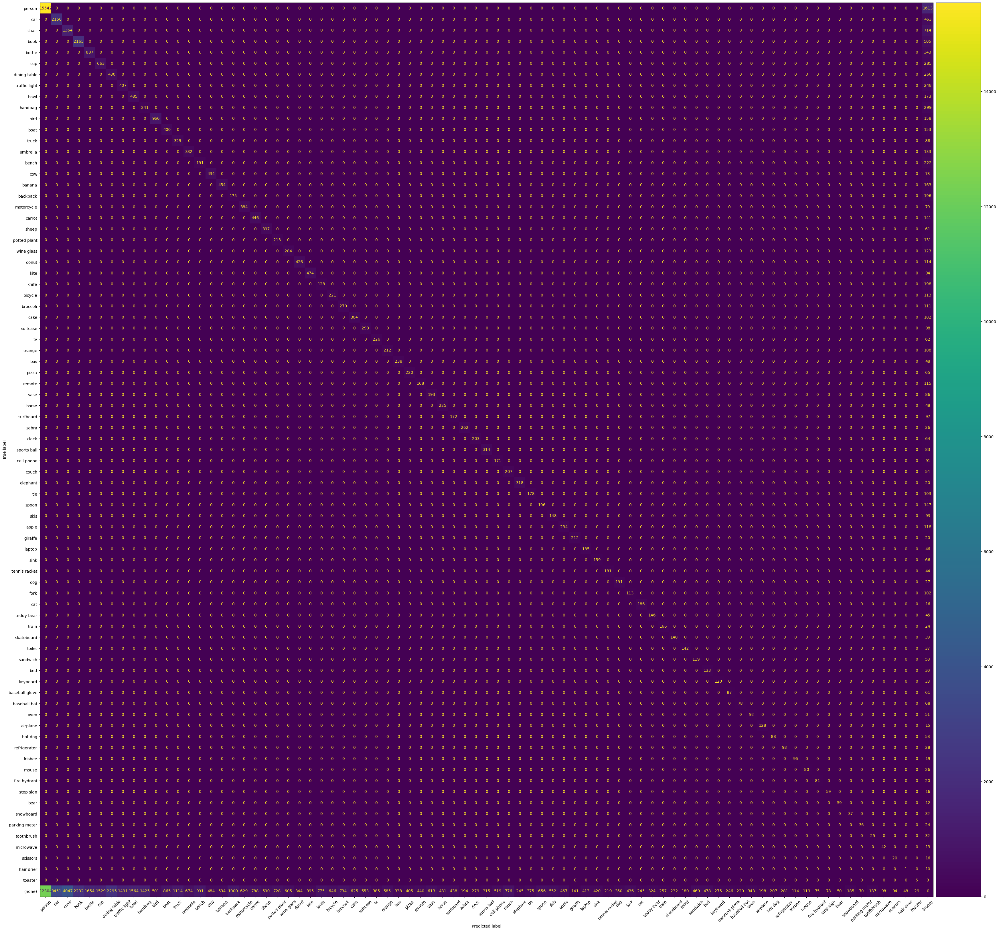

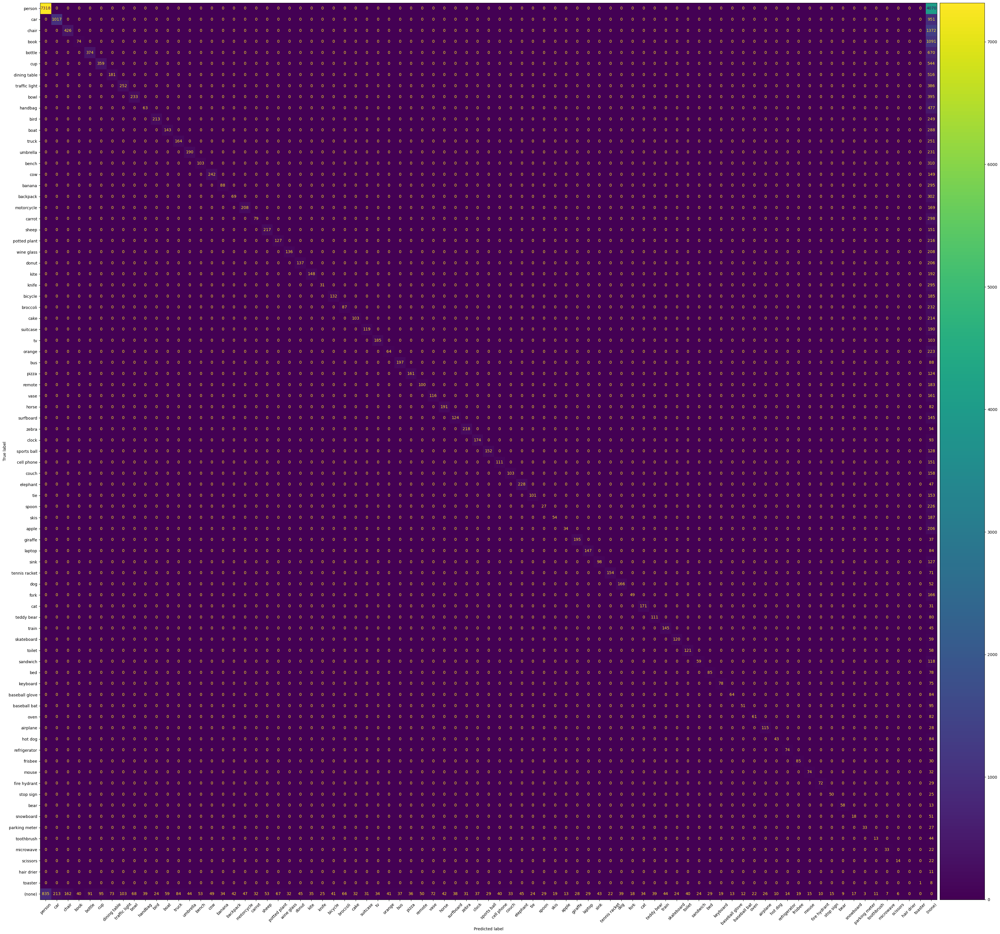

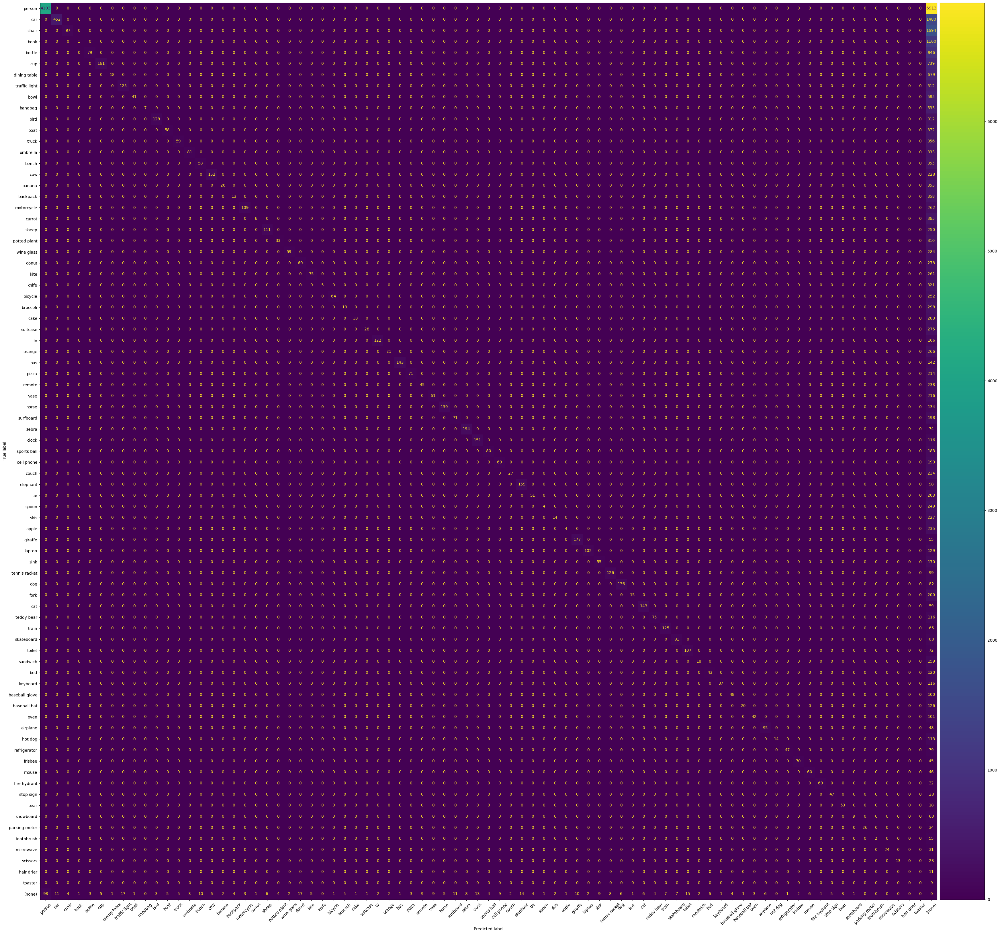

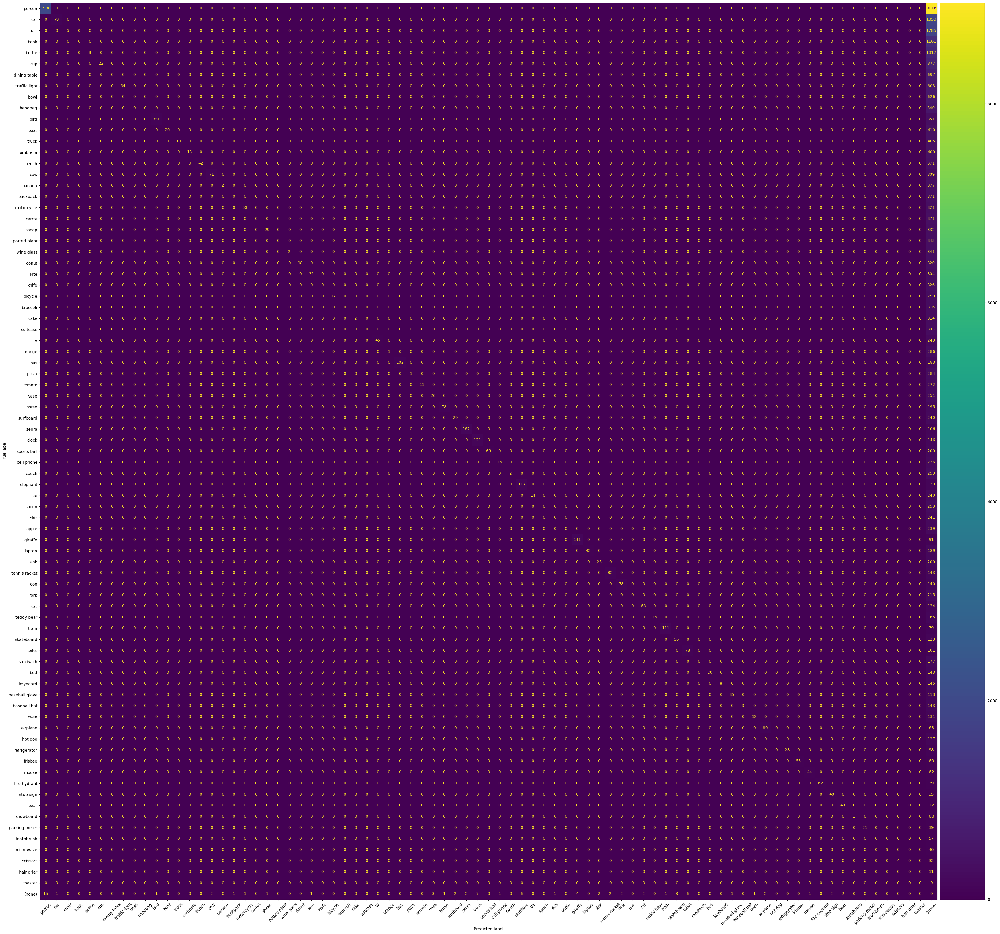

In [ ]:
from copy import deepcopy
counts = dataset.count_values("ground_truth.detections.label")
classes_sort = sorted(counts, key=counts.get, reverse=True)[:]
confidence_thresholds = [0.2, 0.5, 0.75,0.9]  # Include None for the initial evaluation without confidence filtering

for threshold in confidence_thresholds:
    if threshold is None:
        predictions_filtered = predictions_view
    else:
        predictions_filtered = predictions_view.filter_labels("ratina_net", F("confidence") >= threshold, only_matches=False)

    eval_result = predictions_filtered.evaluate_detections(
        "ratina_net",
        gt_field="ground_truth",
        eval_key="eval_2",
        compute_mAP=True,
    )

    calc_map(eval_result)

    d = eval_result.metrics(classes_sort)
    acc = d['accuracy']
    pre = d['precision']
    rec = d['recall']
    fsc = d['fscore']

    print(f'For confidence threshold {threshold}:')
    print('accuracy : ', acc)
    print('precision : ', pre)
    print('recall : ', rec)
    print('fscore : ', fsc)

    plot = eval_result.plot_confusion_matrix(classes=classes_sort[:], backend="matplotlib", figsize=(35, 35))
    plot.show()

    plot = eval_result.plot_confusion_matrix(classes=classes_sort[:10])
    plot.show()

    eval_patches = predictions_filtered.to_evaluation_patches("eval")
    print(eval_patches.count_values("type"))

    iou = eval_patches.count_values('iou')
    x = list(iou.items())
    sum_iou = 0.0
    for i, v in x:
        if not i:
            continue
        sum_iou += (i * v)

    print('IOU Score', sum_iou / sum(iou.values()))

    if threshold is not None:
        print(f"Number of predictions with confidence >= {threshold}: {sum(iou.values())}")


# **SSD Model**

Evaluating detections...


INFO:fiftyone.utils.eval.detection:Evaluating detections...


 100% |███████████████| 5000/5000 [3.3m elapsed, 0s remaining, 32.1 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [3.3m elapsed, 0s remaining, 32.1 samples/s]      


Performing IoU sweep...


INFO:fiftyone.utils.eval.coco:Performing IoU sweep...


 100% |███████████████| 5000/5000 [1.5m elapsed, 0s remaining, 37.5 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [1.5m elapsed, 0s remaining, 37.5 samples/s]      


mAP :  0.22513393572870352
                precision    recall  f1-score   support

        person       0.81      0.63      0.71     12148
           car       0.66      0.40      0.49      1954
         chair       0.52      0.25      0.33      1799
          book       0.61      0.16      0.25      1243
        bottle       0.64      0.25      0.36      1041
           cup       0.57      0.30      0.39       901
  dining table       0.44      0.46      0.45       697
 traffic light       0.58      0.20      0.29       637
          bowl       0.54      0.41      0.47       628
       handbag       0.40      0.08      0.14       540
          bird       0.79      0.26      0.39       445
          boat       0.51      0.30      0.37       436
         truck       0.57      0.40      0.47       415
         bench       0.51      0.26      0.34       413
      umbrella       0.62      0.44      0.52       414
           cow       0.64      0.45      0.53       383
        banana      

For confidence threshold 0.2:
accuracy :  0.3713814146415619
precision :  0.6852185759506351
recall :  0.4477756539498835
fscore :  0.5416165199214543


/usr/local/lib/python3.10/dist-packages/fiftyone/core/plots/plotly.py:1575: UserWarning:

Interactive plots are currently only supported in Jupyter notebooks. Support outside of notebooks and in Google Colab and Databricks will be included in an upcoming release. In the meantime, you can still use this plot, but note that (i) selecting data will not trigger callbacks, and (ii) you must manually call `plot.show()` to launch a new plot that reflects the current state of an attached session.

See https://docs.voxel51.com/user_guide/plots.html#working-in-notebooks for more information.



{None: 153661, 'tp': 16693, 'fn': 20088, 'fp': 2490}
IOU Score 0.072704791274491
Number of predictions with confidence >= 0.2: 192932
Evaluating detections...


INFO:fiftyone.utils.eval.detection:Evaluating detections...


 100% |███████████████| 5000/5000 [2.4m elapsed, 0s remaining, 28.0 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [2.4m elapsed, 0s remaining, 28.0 samples/s]      


Performing IoU sweep...


INFO:fiftyone.utils.eval.coco:Performing IoU sweep...


 100% |███████████████| 5000/5000 [1.4m elapsed, 0s remaining, 73.0 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [1.4m elapsed, 0s remaining, 73.0 samples/s]      


mAP :  0.18150702503806054
                precision    recall  f1-score   support

        person       0.94      0.40      0.56     11087
           car       0.87      0.21      0.34      1933
         chair       0.80      0.12      0.20      1791
          book       0.69      0.01      0.02      1162
        bottle       0.85      0.08      0.15      1025
           cup       0.78      0.15      0.26       899
  dining table       0.62      0.29      0.40       697
 traffic light       0.92      0.05      0.10       637
          bowl       0.79      0.24      0.37       626
       handbag       0.60      0.01      0.01       540
          bird       0.99      0.17      0.30       440
          boat       0.75      0.12      0.21       430
         truck       0.77      0.23      0.35       415
         bench       0.80      0.17      0.28       413
      umbrella       0.89      0.24      0.38       413
           cow       0.86      0.31      0.45       380
        banana      

For confidence threshold 0.5:
accuracy :  0.2666404818015187
precision :  0.8851703755215578
recall :  0.27619409259811767
fscore :  0.42101999049056293


/usr/local/lib/python3.10/dist-packages/fiftyone/core/plots/plotly.py:1575: UserWarning:

Interactive plots are currently only supported in Jupyter notebooks. Support outside of notebooks and in Google Colab and Databricks will be included in an upcoming release. In the meantime, you can still use this plot, but note that (i) selecting data will not trigger callbacks, and (ii) you must manually call `plot.show()` to launch a new plot that reflects the current state of an attached session.

See https://docs.voxel51.com/user_guide/plots.html#working-in-notebooks for more information.



{'fn': 20088, None: 153661, 'tp': 16693, 'fp': 2490}
IOU Score 0.07270479127449074
Number of predictions with confidence >= 0.5: 192932
Evaluating detections...


INFO:fiftyone.utils.eval.detection:Evaluating detections...


 100% |███████████████| 5000/5000 [2.2m elapsed, 0s remaining, 49.8 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [2.2m elapsed, 0s remaining, 49.8 samples/s]      


Performing IoU sweep...


INFO:fiftyone.utils.eval.coco:Performing IoU sweep...


 100% |███████████████| 5000/5000 [1.2m elapsed, 0s remaining, 81.9 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [1.2m elapsed, 0s remaining, 81.9 samples/s]      


mAP :  0.14422562582510562
                precision    recall  f1-score   support

        person       0.97      0.27      0.43     11008
           car       0.94      0.11      0.19      1932
         chair       0.94      0.06      0.12      1791
          book       1.00      0.00      0.01      1161
        bottle       0.85      0.03      0.05      1025
           cup       0.91      0.10      0.18       899
  dining table       0.78      0.18      0.29       697
 traffic light       0.95      0.03      0.05       637
          bowl       0.86      0.15      0.26       626
       handbag       1.00      0.00      0.00       540
          bird       0.98      0.14      0.25       440
          boat       0.91      0.07      0.14       430
         truck       0.87      0.14      0.24       415
         bench       0.89      0.11      0.20       413
      umbrella       0.89      0.14      0.25       413
           cow       0.93      0.24      0.38       380
        banana      

For confidence threshold 0.75:
accuracy :  0.18805648957632817
precision :  0.9471616312152825
recall :  0.19005029223868425
fscore :  0.3165783634469954


/usr/local/lib/python3.10/dist-packages/fiftyone/core/plots/plotly.py:1575: UserWarning:

Interactive plots are currently only supported in Jupyter notebooks. Support outside of notebooks and in Google Colab and Databricks will be included in an upcoming release. In the meantime, you can still use this plot, but note that (i) selecting data will not trigger callbacks, and (ii) you must manually call `plot.show()` to launch a new plot that reflects the current state of an attached session.

See https://docs.voxel51.com/user_guide/plots.html#working-in-notebooks for more information.



{None: 153661, 'tp': 16693, 'fn': 20088, 'fp': 2490}
IOU Score 0.072704791274491
Number of predictions with confidence >= 0.75: 192932
Evaluating detections...


INFO:fiftyone.utils.eval.detection:Evaluating detections...


 100% |███████████████| 5000/5000 [2.0m elapsed, 0s remaining, 40.8 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [2.0m elapsed, 0s remaining, 40.8 samples/s]      


Performing IoU sweep...


INFO:fiftyone.utils.eval.coco:Performing IoU sweep...


 100% |███████████████| 5000/5000 [1.3m elapsed, 0s remaining, 84.4 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [1.3m elapsed, 0s remaining, 84.4 samples/s]      


mAP :  0.11054483785549732
                precision    recall  f1-score   support

        person       0.98      0.20      0.33     11004
           car       1.00      0.06      0.11      1932
         chair       0.97      0.03      0.07      1791
          book       1.00      0.00      0.00      1161
        bottle       1.00      0.01      0.03      1025
           cup       0.98      0.07      0.13       899
  dining table       0.78      0.06      0.10       697
 traffic light       0.93      0.02      0.04       637
          bowl       0.98      0.07      0.14       626
       handbag       1.00      0.00      0.00       540
          bird       1.00      0.11      0.20       440
          boat       1.00      0.04      0.08       430
         truck       0.95      0.09      0.17       415
         bench       0.89      0.08      0.14       413
      umbrella       0.97      0.07      0.13       413
           cow       0.97      0.19      0.32       380
        banana      

For confidence threshold 0.9:
accuracy :  0.13163596966413868
precision :  0.9721944388877776
recall :  0.1321334384600745
fscore :  0.2326471996170417


/usr/local/lib/python3.10/dist-packages/fiftyone/core/plots/plotly.py:1575: UserWarning:

Interactive plots are currently only supported in Jupyter notebooks. Support outside of notebooks and in Google Colab and Databricks will be included in an upcoming release. In the meantime, you can still use this plot, but note that (i) selecting data will not trigger callbacks, and (ii) you must manually call `plot.show()` to launch a new plot that reflects the current state of an attached session.

See https://docs.voxel51.com/user_guide/plots.html#working-in-notebooks for more information.



{'fn': 20088, None: 153661, 'fp': 2490, 'tp': 16693}
IOU Score 0.07270479127449088
Number of predictions with confidence >= 0.9: 192932


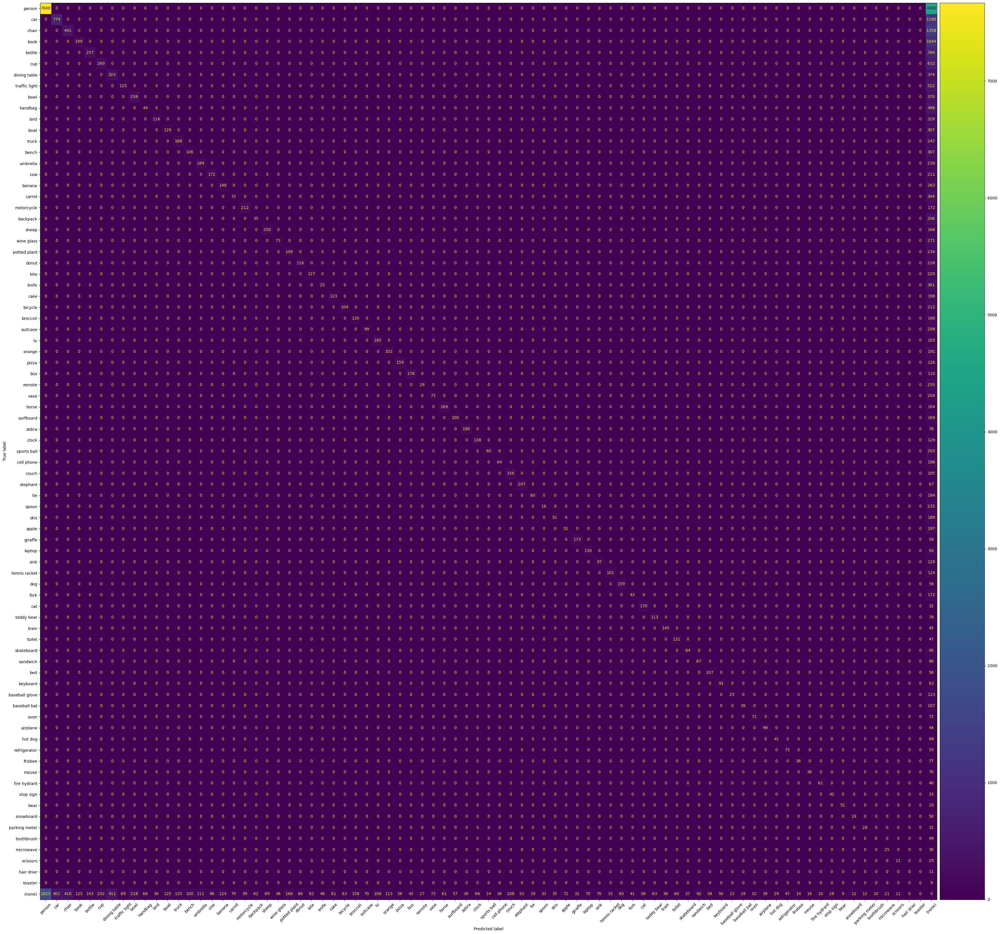

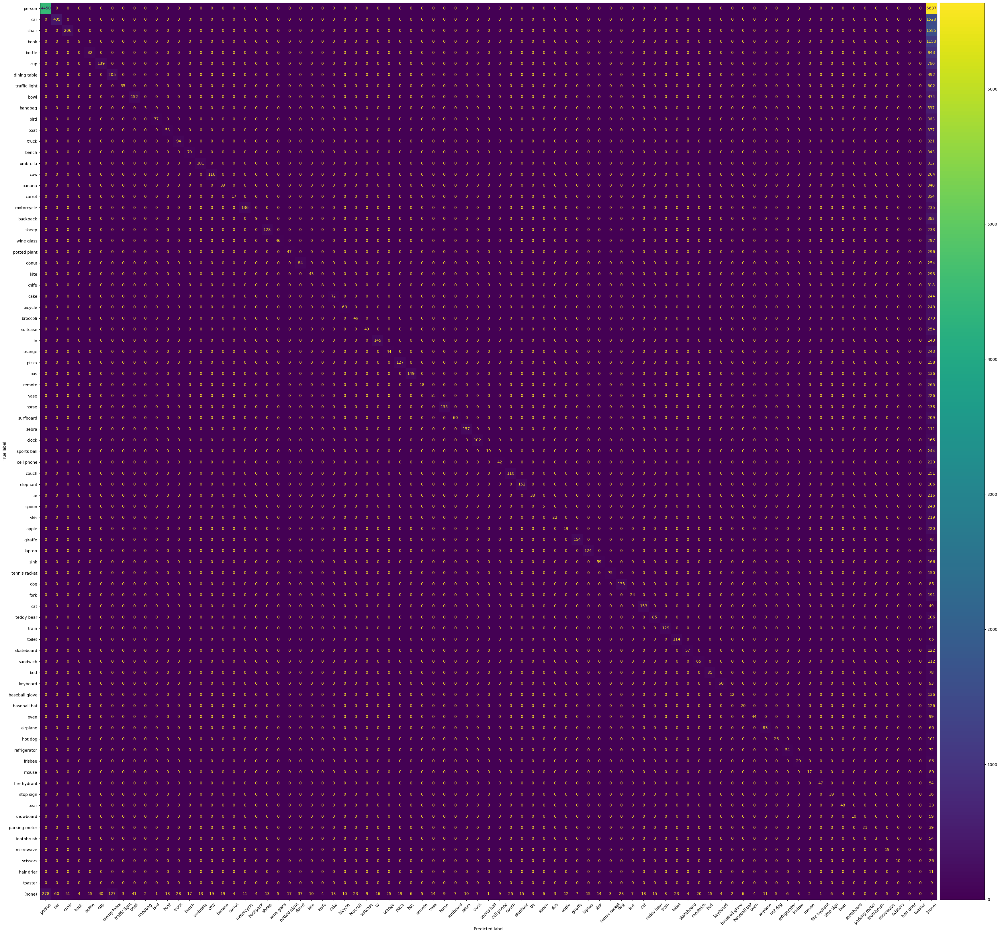

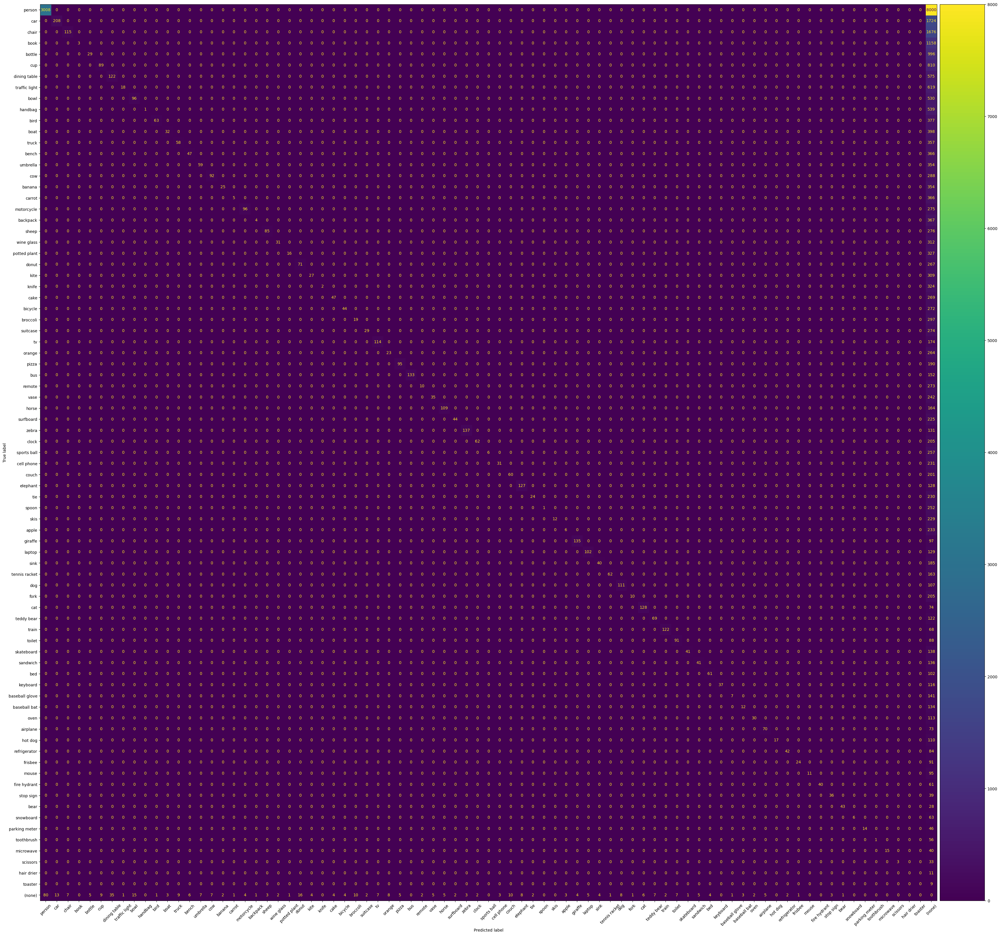

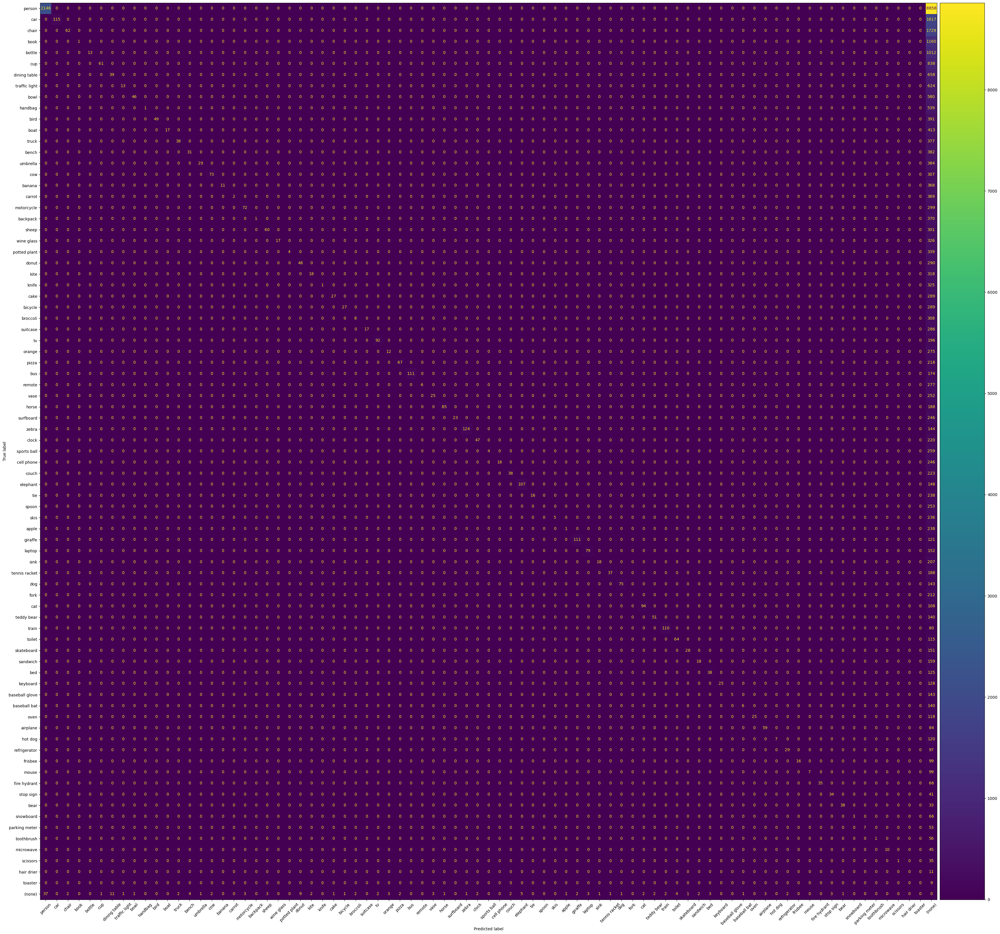

In [ ]:
from copy import deepcopy
counts = dataset.count_values("ground_truth.detections.label")
classes_sort = sorted(counts, key=counts.get, reverse=True)[:]
confidence_thresholds = [0.2, 0.5, 0.75,0.9]  # Include None for the initial evaluation without confidence filtering

for threshold in confidence_thresholds:
    if threshold is None:
        predictions_filtered = predictions_view
    else:
        predictions_filtered = predictions_view.filter_labels("ssd_model", F("confidence") >= threshold, only_matches=False)

    eval_result = predictions_filtered.evaluate_detections(
        "ssd_model",
        gt_field="ground_truth",
        eval_key="eval_3",
        compute_mAP=True,
    )

    calc_map(eval_result)

    d = eval_result.metrics(classes_sort)
    acc = d['accuracy']
    pre = d['precision']
    rec = d['recall']
    fsc = d['fscore']

    print(f'For confidence threshold {threshold}:')
    print('accuracy : ', acc)
    print('precision : ', pre)
    print('recall : ', rec)
    print('fscore : ', fsc)

    plot = eval_result.plot_confusion_matrix(classes=classes_sort[:], backend="matplotlib", figsize=(35, 35))
    plot.show()

    plot = eval_result.plot_confusion_matrix(classes=classes_sort[:10])
    plot.show()

    eval_patches = predictions_filtered.to_evaluation_patches("eval")
    print(eval_patches.count_values("type"))

    iou = eval_patches.count_values('iou')
    x = list(iou.items())
    sum_iou = 0.0
    for i, v in x:
        if not i:
            continue
        sum_iou += (i * v)

    print('IOU Score', sum_iou / sum(iou.values()))

    if threshold is not None:
        print(f"Number of predictions with confidence >= {threshold}: {sum(iou.values())}")


# Bonus Feature Map

In [ ]:
import torch
import torch.nn as nn
import torchvision
from torchvision import models, transforms, utils
from torch.autograd import Variable
import matplotlib.pyplot as plt
import scipy.misc
from PIL import Image
import numpy as np
import PIL
%matplotlib inline

In [ ]:
conv_layers = []
layer_list = list(list(list(model_fasterrcnn_resnet50.children())[1].children())[0].children())

for layer in layer_list:
    if isinstance(layer, nn.Conv2d):
        conv_layers.append(layer)
    elif isinstance(layer, nn.Sequential):
        for sub_layer in layer:
            for sub_child in sub_layer.children():
                if isinstance(sub_child, nn.Conv2d):
                    conv_layers.append(sub_child)

In [ ]:
transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize(mean=0., std=1.)
])

In [ ]:
def show_feature_map(image, conv_layers, device='cuda'):  # Specify the device, default is 'cuda'
    model = nn.Sequential(*conv_layers).to(device)
    image = transform(image).to(device)  # Move the input image to the same device as the model
    outputs = []
    names = []

    for layer in model:  # Iterate over the convolutional layers
        image = layer(image)
        if image.shape[1] < 32:
            continue
        outputs.append(image)
        names.append(str(layer))

    processed = []
    for feature_map in outputs:
        feature_map = feature_map.squeeze(0)
        gray_scale = torch.sum(feature_map, 0)
        gray_scale = gray_scale / feature_map.shape[0]
        processed.append(gray_scale.data.cpu().numpy())

    fig = plt.figure(figsize=(30, 50))

    for i in range(len(processed)):
        a = fig.add_subplot(5, 4, i + 1)
        imgplot = plt.imshow(processed[i])
        a.axis("off")
        a.set_title(names[i].split('(')[0], fontsize=30)

    plt.savefig(str('feature_maps.jpg'), bbox_inches='tight')

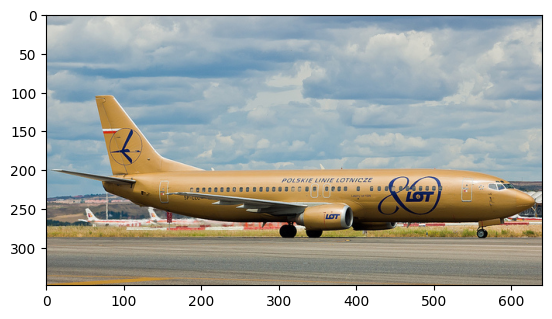

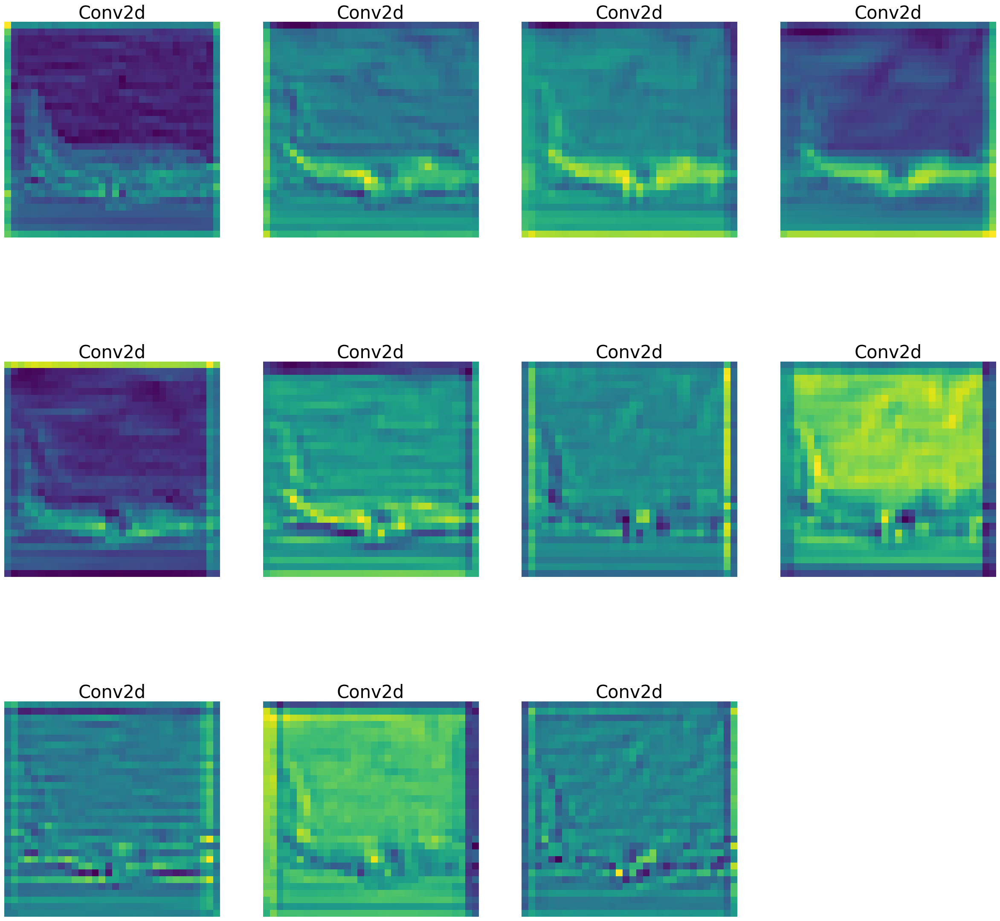

In [ ]:
image = Image.open(str('/root/fiftyone/coco-2017/validation/data/000000005477.jpg'))
plt.imshow(image)
show_feature_map(image,conv_layers)

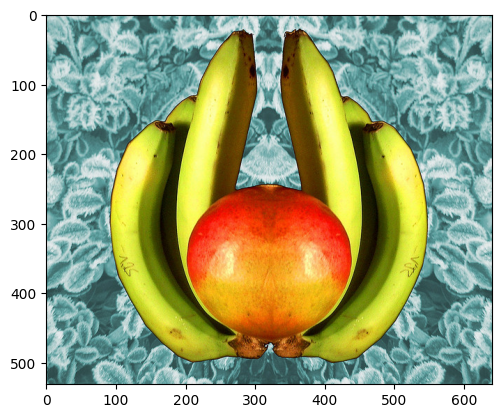

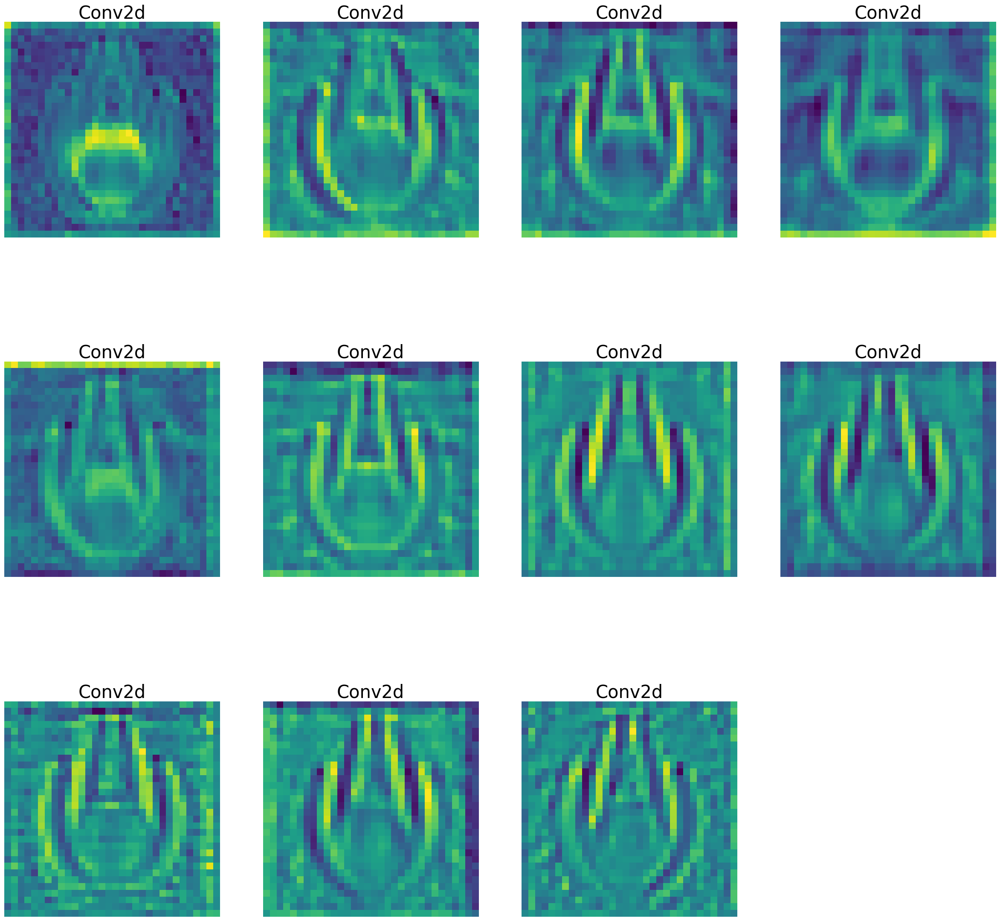

In [ ]:
image = Image.open(str('/root/fiftyone/coco-2017/validation/data/000000006012.jpg'))
plt.imshow(image)
show_feature_map(image,conv_layers)

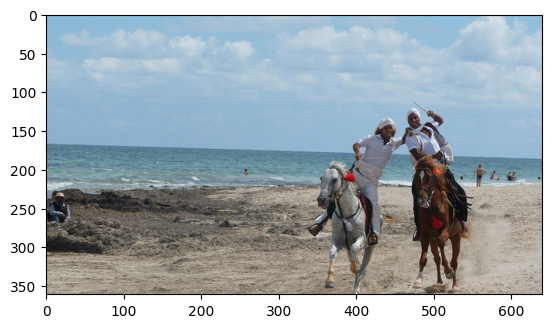

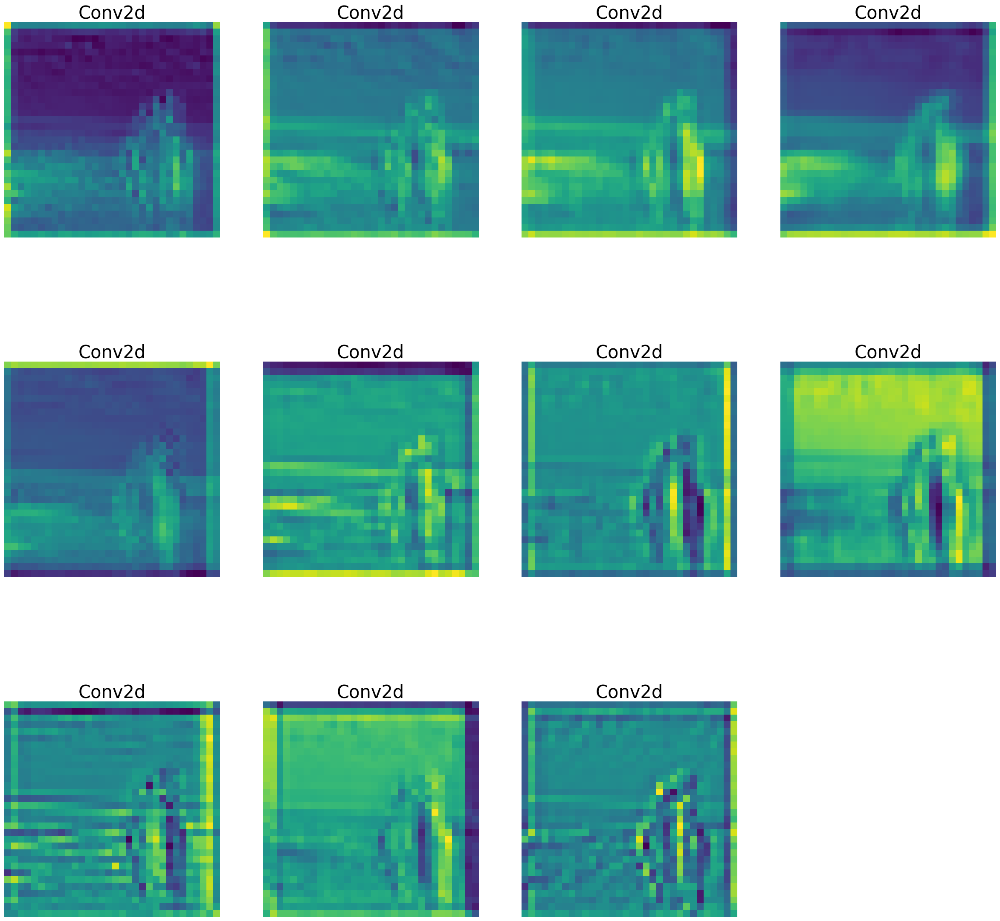

In [ ]:
image = Image.open(str('/root/fiftyone/coco-2017/validation/data/000000007281.jpg'))
plt.imshow(image)
show_feature_map(image,conv_layers)